# Generative Adversarial Networks



In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

In [ ]:
from gan.train import train

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# GAN loss functions

In this repo, I have implemented two different types of GAN cost functions: the loss from the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf) and the loss from [LS-GAN](https://arxiv.org/abs/1611.04076).

### GAN loss

`discriminator_loss` and `generator_loss` functions are in `gan/losses.py`.

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: You should use the `torch.nn.functional.binary_cross_entropy_with_logits` function to compute the binary cross entropy loss since it is more numerically stable than using a softmax followed by BCE loss. The BCE loss is needed to compute the log probability of the true label given the logits output from the discriminator. Given a score $s\in\mathbb{R}$ and a label $y\in\{0, 1\}$, the binary cross entropy loss is

$$ bce(s, y) = -y * \log(s) - (1 - y) * \log(1 - s) $$


Instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing.

In [ ]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss

**TODO:** Implement the `ls_discriminator_loss` and `ls_generator_loss` functions in `gan/losses.py`.

We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [ ]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

architecture inspired by [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1

we use padding = 1 (not 0) for all the convolutional layers.

Instead of Relu, we use LeakyReLu throughout the discriminator (a negative slope value of 0.2).

The output of your discriminator should be a single value score corresponding to each input sample.


**Generator:**


- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

The output of the final layer of the generator network should have a `tanh` nonlinearity to output values between -1 and 1. The output should be a 3x64x64 tensor for each sample (equal dimensions to the images from the dataset).





In [ ]:
from gan.models import Discriminator, Generator

# Data loading

The cat images we provide are RGB images with a resolution of 64x64. In order to prevent our discriminator from overfitting, we will need to perform some data augmentation.


In [ ]:
!bash download_cat.sh

In [ ]:
batch_size = 64
imsize = 64
cat_root = './cats'

cat_train = ImageFolder(root=cat_root, transform=transforms.Compose([
  transforms.ToTensor(),
  transforms.Resize(int(1.15 * imsize)),
  transforms.RandomCrop(imsize),
]))

cat_loader_train = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

### Visualize dataset

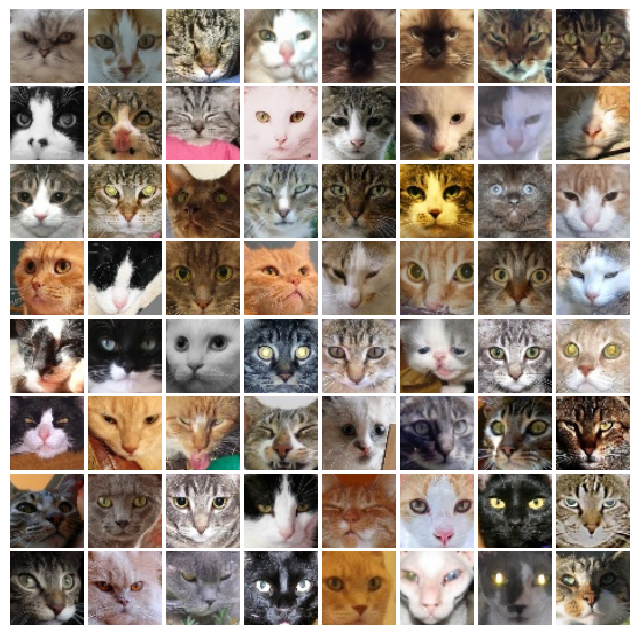

In [ ]:
from gan.utils import show_images

try:
  imgs = next(iter(cat_loader_train))[0].numpy().squeeze()
except:
  imgs = cat_loader_train.__iter__().next()[0].numpy().squeeze()

show_images(imgs, color=True)

# Training


In [ ]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

### 1. cat-gan

In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

In [ ]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss,
          generator_loss, num_epochs=NUM_EPOCHS, show_every=250,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)


Output hidden; open in https://colab.research.google.com to view.

### 2. LS-cat-gan

In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

In [ ]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss,
          ls_generator_loss, num_epochs=NUM_EPOCHS, show_every=250,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)

Output hidden; open in https://colab.research.google.com to view.

### 3. food-gan

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt

batch_size = 100
imsize = 64
food_root = './food-101'

food_train = ImageFolder(root=food_root, transform=transforms.Compose([
  transforms.ToTensor(),

  # Example use of RandomCrop:
  transforms.Resize(int(1.15 * imsize)),
  transforms.RandomCrop(imsize),
]))



In [ ]:
n = 5000
foodData_small = torch.utils.data.Subset(food_train, np.random.choice(len(food_train), n, replace=False))
food_loader_train = DataLoader(foodData_small, batch_size=batch_size, drop_last=True)

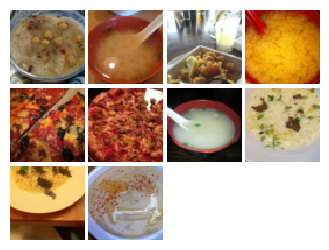

In [ ]:
from gan.utils import show_images

try:
  imgs = next(iter(food_loader_train))[0].numpy().squeeze()
except:
  imgs = food_loader_train.__iter__().next()[0].numpy().squeeze()

show_images(imgs, color=True)

In [ ]:
print(len(food_loader_train))

500


In [ ]:
from gan.losses import discriminator_loss, generator_loss

In [ ]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

###NOTE: Because of Output Buffer limit in colab, we had to clear the initial training output of GAN for FOOD 101. Below are the output images of the final epoch.

EPOCH:  1
Iter: 0, D: 0.6813, G:1.739


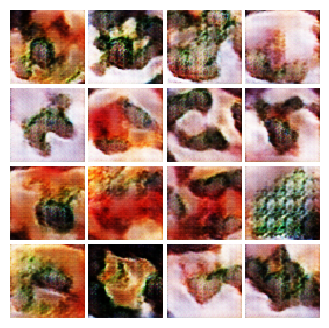


Iter: 50, D: 1.434, G:1.213


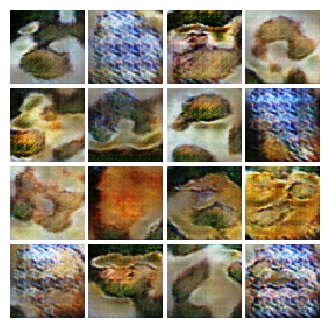


Iter: 100, D: 1.359, G:1.373


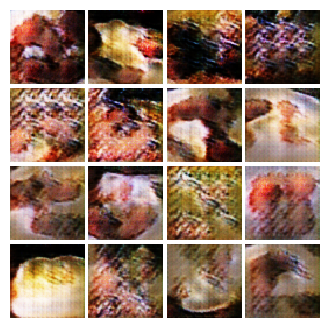

KeyboardInterrupt: 

In [ ]:
train(D, G, D_optimizer, G_optimizer, discriminator_loss,
          generator_loss, num_epochs=1, show_every=50,
          batch_size=100, train_loader=food_loader_train, device=device)

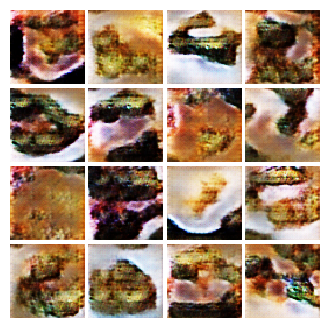

In [ ]:
from gan.utils import sample_noise, show_images, deprocess_img, preprocess_img

with torch.no_grad():
  d_noise = sample_noise(20, 100).to(device)

  fake_images = G(d_noise.view(20, 100,1,1))
  #fake_images = torch.reshape(fake_images, (batch_size, input_channels, img_size, img_size))

  disp_fake_images = deprocess_img(fake_images.data)  # denormalize
  imgs_numpy = (disp_fake_images).cpu().numpy()
  show_images(imgs_numpy[0:16], color=3 != 1)
  plt.show()
  print()

In [ ]:
torch.save(G, "generator_food_101.pt")

In [ ]:
torch.save(D, "discriminator_food_101.pt")

### 4. wasserstein-cat-gan

In [ ]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

In [ ]:
from gan.losses import wasserstein_discriminator_loss, wasserstein_generator_loss

In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: -0.1257, G:18.87


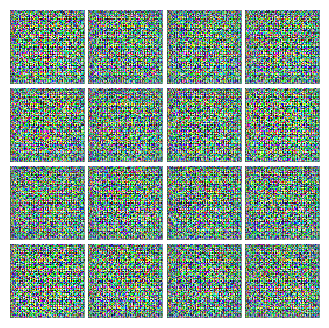


EPOCH:  2
Iter: 250, D: -8.754e+03, G:4.394e+03


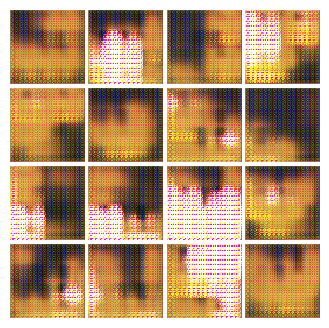


EPOCH:  3
Iter: 500, D: -6.431e+03, G:6.148e+03


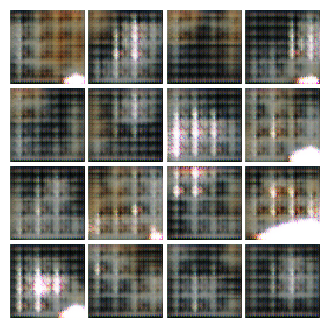


EPOCH:  4
Iter: 750, D: -1.268e+04, G:1.222e+04


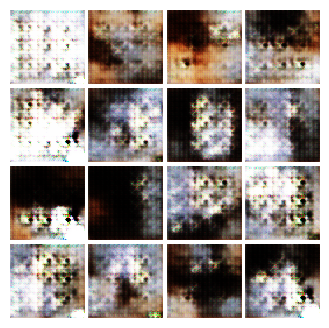


EPOCH:  5
Iter: 1000, D: -3.103e+04, G:2.009e+04


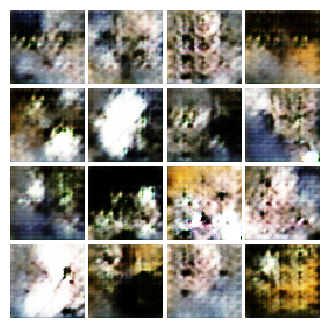


EPOCH:  6
Iter: 1250, D: -2.857e+04, G:2.975e+04


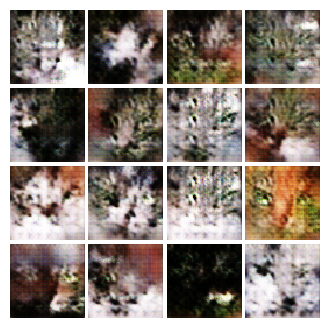


EPOCH:  7
Iter: 1500, D: -5.092e+04, G:4.646e+04


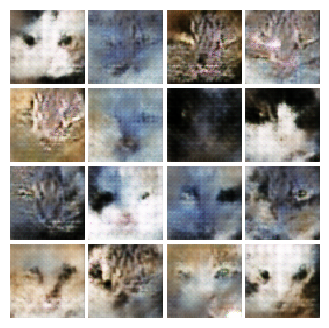


EPOCH:  8
Iter: 1750, D: -1.952e+04, G:2.821e+04


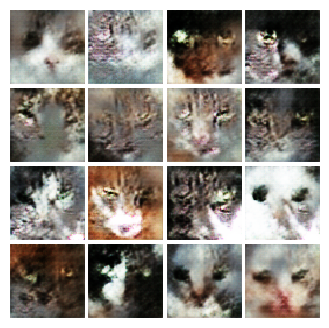


EPOCH:  9
Iter: 2000, D: -1.219e+05, G:7.342e+04


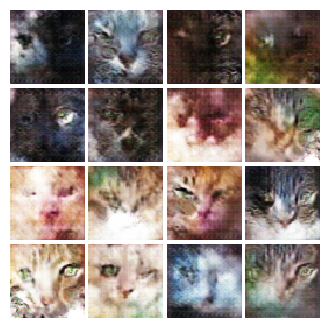


EPOCH:  10
Iter: 2250, D: -1.35e+05, G:1.025e+05


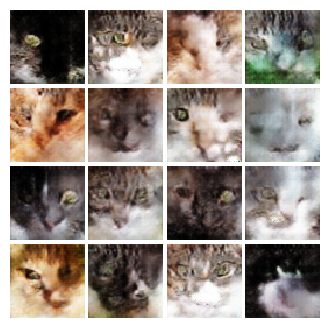


EPOCH:  11
Iter: 2500, D: -1.939e+05, G:1.354e+05


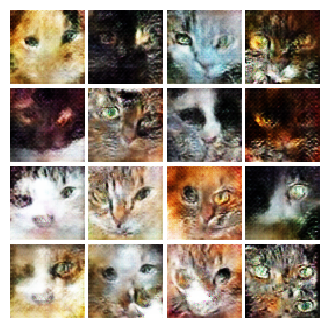


EPOCH:  12
Iter: 2750, D: -1.499e+05, G:1.475e+05


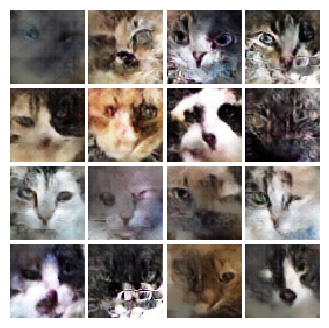


EPOCH:  13
Iter: 3000, D: -2.673e+05, G:1.482e+05


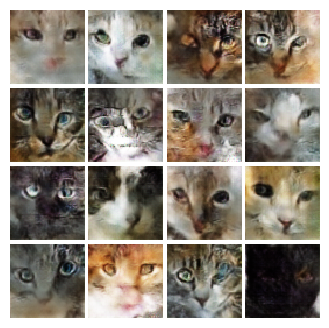


EPOCH:  14
Iter: 3250, D: -3.189e+05, G:2.245e+05


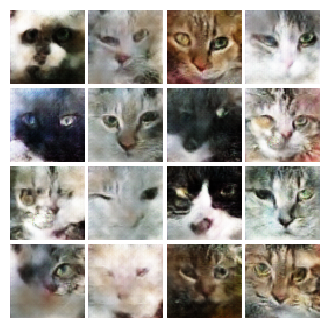


EPOCH:  15
Iter: 3500, D: -3.375e+05, G:2.232e+05


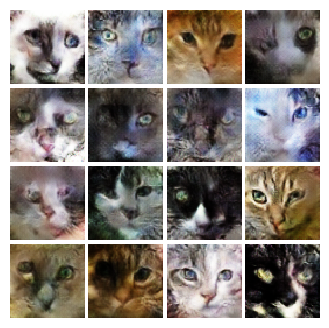


EPOCH:  16
Iter: 3750, D: -3.063e+05, G:2.538e+05


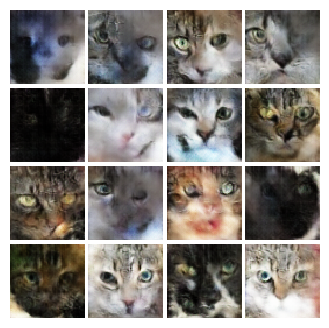


EPOCH:  17
Iter: 4000, D: -3.639e+05, G:2.037e+05


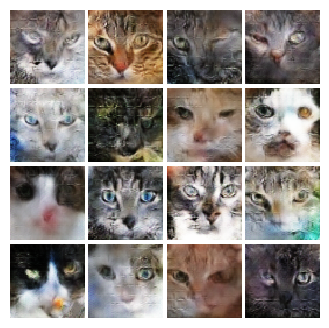


EPOCH:  18
Iter: 4250, D: -4.913e+05, G:3.923e+05


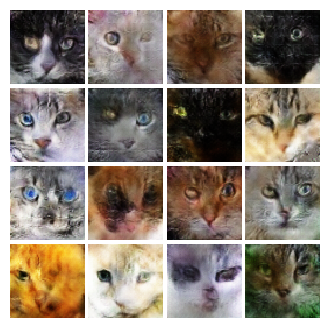


EPOCH:  19
Iter: 4500, D: -5.501e+05, G:3.336e+05


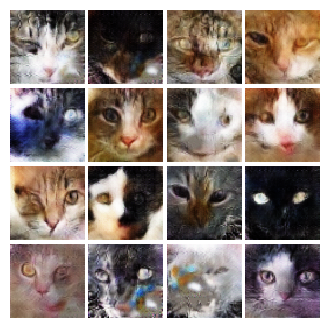


EPOCH:  20
Iter: 4750, D: -6.303e+05, G:3.816e+05


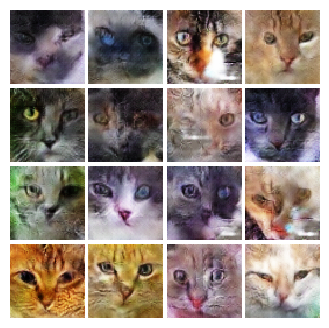


EPOCH:  21
Iter: 5000, D: -6.154e+05, G:5.066e+05


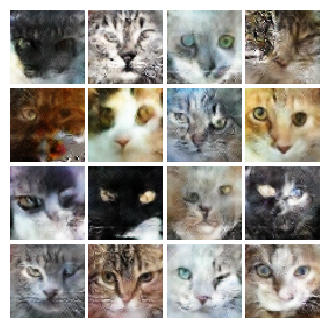


EPOCH:  22
Iter: 5250, D: -1.185e+06, G:6.324e+05


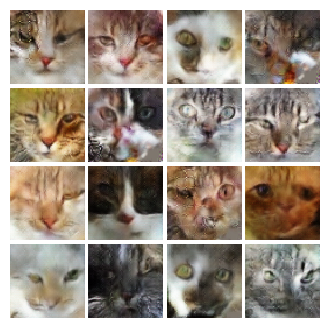


EPOCH:  23
Iter: 5500, D: -8.33e+05, G:6.215e+05


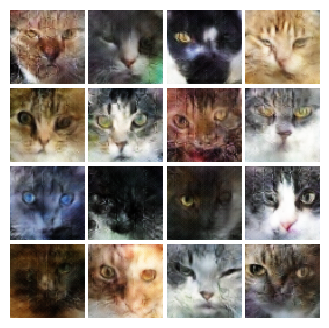


EPOCH:  24
Iter: 5750, D: -1.068e+06, G:7.328e+05


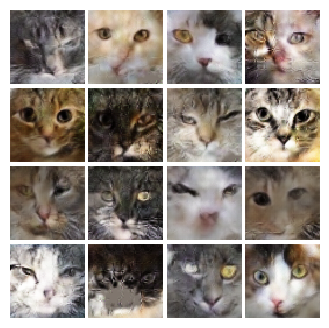


EPOCH:  25
Iter: 6000, D: -1.335e+06, G:7.474e+05


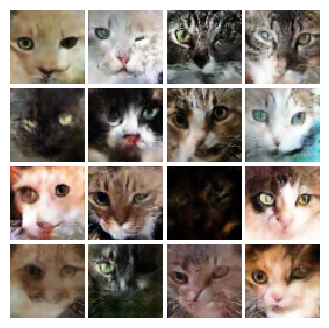


EPOCH:  26
Iter: 6250, D: -1.231e+06, G:6.789e+05


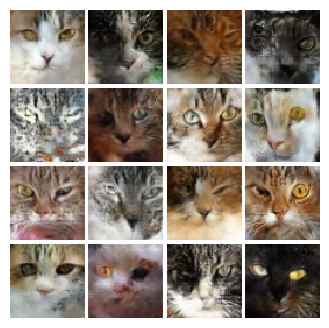


EPOCH:  27
Iter: 6500, D: -7.739e+05, G:9.134e+05


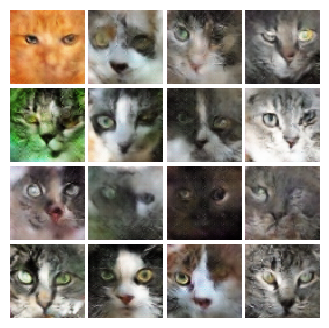


EPOCH:  28
Iter: 6750, D: -1.253e+06, G:6.556e+05


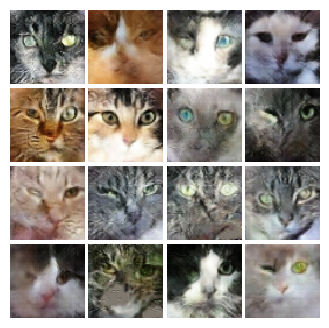


EPOCH:  29
Iter: 7000, D: -1.545e+06, G:7.945e+05


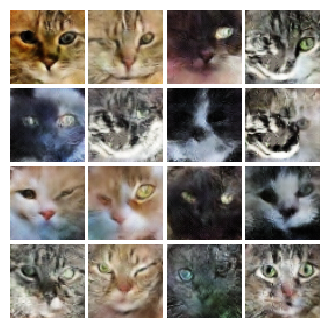


EPOCH:  30
Iter: 7250, D: -2.224e+06, G:1.171e+06


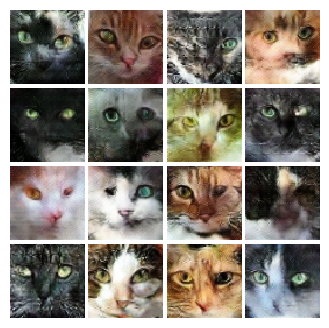


EPOCH:  31
Iter: 7500, D: -2.559e+06, G:1.31e+06


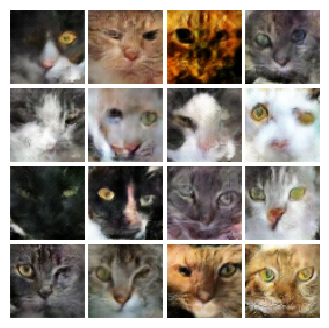


EPOCH:  32
Iter: 7750, D: -1.758e+06, G:1.113e+06


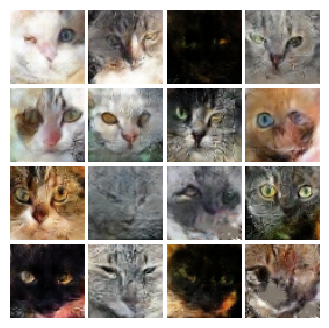


EPOCH:  33
Iter: 8000, D: -1.303e+06, G:1.133e+06


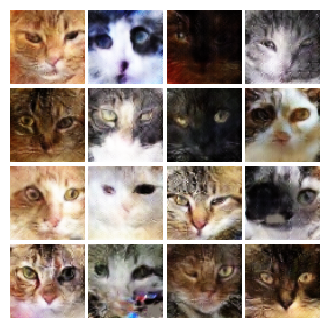


EPOCH:  34
Iter: 8250, D: 4.219e+04, G:-6.947e+05


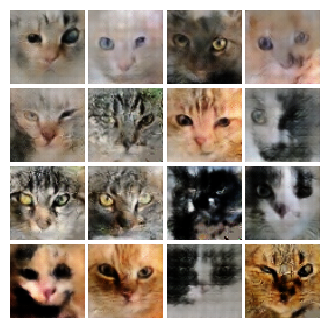


EPOCH:  35
Iter: 8500, D: -2.104e+06, G:1.046e+06


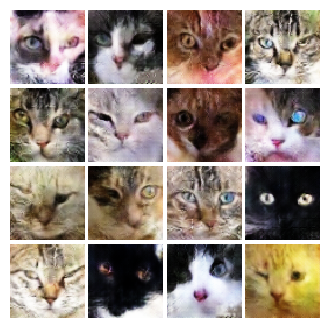


EPOCH:  36
Iter: 8750, D: -5.894e+05, G:8.758e+05


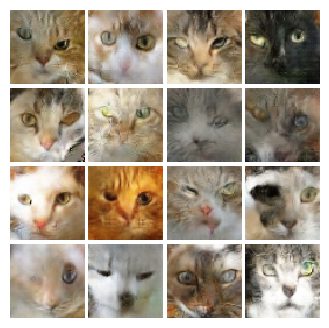


EPOCH:  37
Iter: 9000, D: -3.633e+06, G:1.808e+06


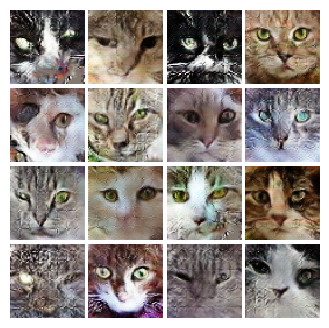


EPOCH:  38
Iter: 9250, D: -2.353e+06, G:1.73e+06


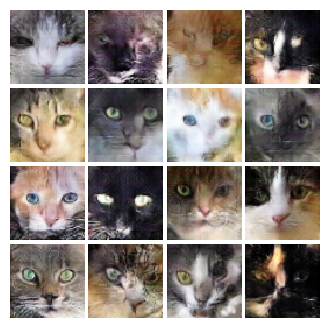


EPOCH:  39
Iter: 9500, D: -1.614e+06, G:7.747e+05


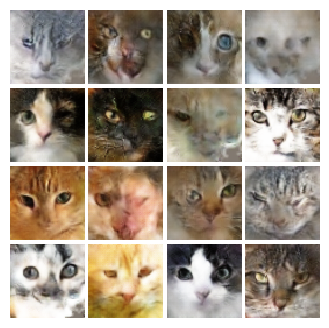


EPOCH:  40
Iter: 9750, D: -2.105e+06, G:1.776e+06


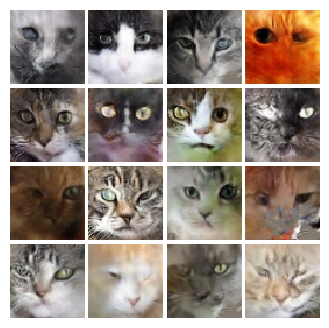


EPOCH:  41
Iter: 10000, D: -7.588e+05, G:1.133e+05


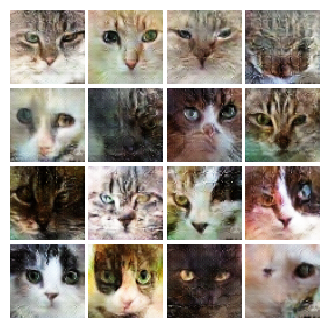


EPOCH:  42
Iter: 10250, D: -4.514e+06, G:2.262e+06


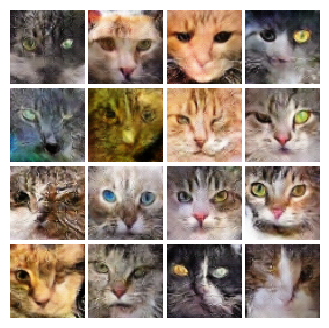


EPOCH:  43
Iter: 10500, D: -2.415e+06, G:8.44e+05


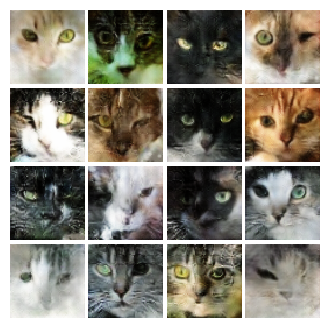


EPOCH:  44
Iter: 10750, D: -4.379e+06, G:2.297e+06


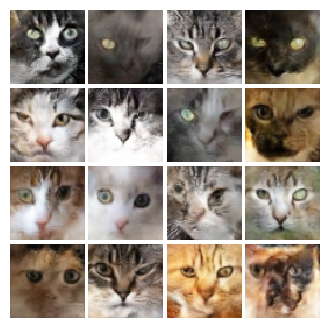


EPOCH:  45
Iter: 11000, D: -5.024e+06, G:2.508e+06


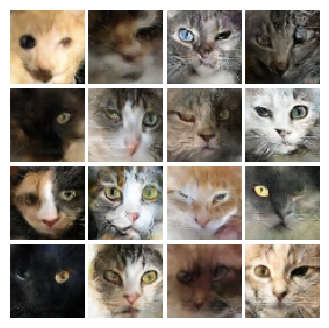


EPOCH:  46
Iter: 11250, D: -3.073e+06, G:1.999e+06


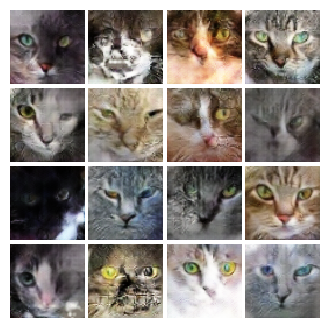


EPOCH:  47
Iter: 11500, D: -5.65e+06, G:2.839e+06


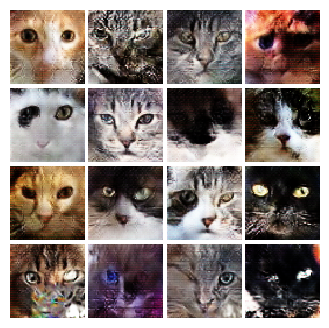


EPOCH:  48
Iter: 11750, D: -5.98e+06, G:2.984e+06


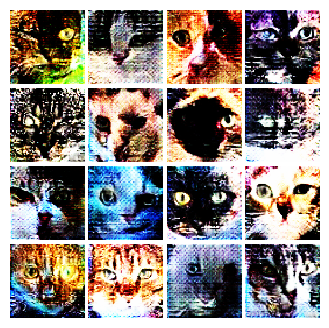


EPOCH:  49
Iter: 12000, D: -6.265e+06, G:3.141e+06


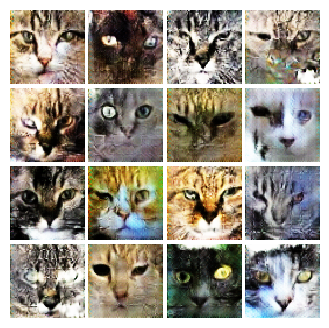


EPOCH:  50
Iter: 12250, D: -6.358e+06, G:3.158e+06


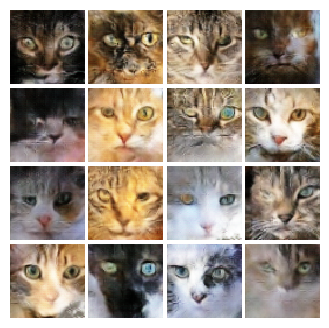

In [ ]:
train(D, G, D_optimizer, G_optimizer, wasserstein_discriminator_loss,
          wasserstein_generator_loss, num_epochs=NUM_EPOCHS, show_every=250,
          batch_size=batch_size, train_loader=cat_loader_train, device=device, gan_type = "wgan")

In [ ]:
torch.save(D,"discriminator_wgan.pt")
torch.save(G,"generator_wgan.pt")